# Introduction to Artificial Intelligence - Homework05
- NETID:
- Name:

This assignment covers the following topics:
- Support Vector Machines
- Classification
- Regression
- Using sklearn

Complete all sections. Some questions will require written answers, while others will involve coding. Be sure to run your code cells to verify your solutions.

**Task 1:**

Fill in the missing code where indicated to create a support vector machine classifier

In [54]:
from scipy import optimize

class KernelSvmClassifier:
    
    def __init__(self, C, kernel):
        self.C = C                               
        self.kernel = kernel          # <---
        self.alpha = None
        self.supportVectors = None
    
    def fit(self, X, y):
        N = len(y)
        # --->
        # Gram matrix of h(x) y
        hXX = np.apply_along_axis(lambda x1 : np.apply_along_axis(lambda x2:  self.kernel(x1, x2), 1, X),
                                  1, X)   
        yp = y.reshape(-1, 1)
        GramHXy = hXX * np.matmul(yp, yp.T) 
        # <---

        # Lagrange dual problem
        def Ld0(G, alpha):
            return alpha.sum() - 0.5 * alpha.dot(alpha.dot(G))

        # Partial derivate of Ld on alpha
        def Ld0dAlpha(G, alpha):
            return np.ones_like(alpha) - alpha.dot(G)

        # Constraints on alpha of the shape :
        # -  d - C*alpha  = 0
        # -  b - A*alpha >= 0
        A = np.vstack((-np.eye(N), np.eye(N)))             # <---
        b = np.hstack((np.zeros(N), self.C * np.ones(N)))  # <---
        constraints = ({'type': 'eq',   'fun': lambda a: np.dot(a, y),     'jac': lambda a: y},
                       {'type': 'ineq', 'fun': lambda a: b - np.dot(A, a), 'jac': lambda a: -A})

        # Maximize by minimizing the opposite
        optRes = optimize.minimize(fun=lambda a: -Ld0(GramHXy, a),
                                   x0=np.ones(N), 
                                   method='SLSQP', 
                                   jac=lambda a: -Ld0dAlpha(GramHXy, a), 
                                   constraints=constraints)
        self.alpha = optRes.x
        # --->
        epsilon = 1e-8
        supportIndices = self.alpha > epsilon
        self.supportVectors = X[supportIndices]
        self.supportAlphaY = y[supportIndices] * self.alpha[supportIndices]
        # <---
    
    def predict(self, X):
        """ Predict y values in {0, 1} """
        # Debugging: Print the shape of the input
        print("Input shape:", X.shape)

        def predict1(x):
            # Debugging: Print the shape of each support vector
            print("Support vector shape:", self.supportVectors.shape)
            x1 = np.apply_along_axis(lambda s: self.kernel(s, x), 1, self.supportVectors)
            x2 = x1 * self.supportAlphaY
            return np.sum(x2)
        
        d = np.apply_along_axis(predict1, 1, X)
        # Debugging: Print the decision values
        print("Decision values:", d)
        return (d > 0).astype(int)

def GRBF(x1, x2):
    diff = x1 - x2
    return np.exp(-np.dot(diff, diff) * len(x1) / 2)

Linear SVM Accuracy on Circles: 0.30
Input shape: (20, 2)
Support vector shape: (36, 2)
Support vector shape: (36, 2)
Support vector shape: (36, 2)
Support vector shape: (36, 2)
Support vector shape: (36, 2)
Support vector shape: (36, 2)
Support vector shape: (36, 2)
Support vector shape: (36, 2)
Support vector shape: (36, 2)
Support vector shape: (36, 2)
Support vector shape: (36, 2)
Support vector shape: (36, 2)
Support vector shape: (36, 2)
Support vector shape: (36, 2)
Support vector shape: (36, 2)
Support vector shape: (36, 2)
Support vector shape: (36, 2)
Support vector shape: (36, 2)
Support vector shape: (36, 2)
Support vector shape: (36, 2)
Decision values: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
Handmade SVM Accuracy on Circles: 0.70
Input shape: (184025, 2)
Support vector shape: (36, 2)
Support vector shape: (36, 2)
Support vector shape: (36, 2)
Support vector shape: (36, 2)
Support vector shape: (36, 2)
Support vector shape: (36, 2)
Support vector shap

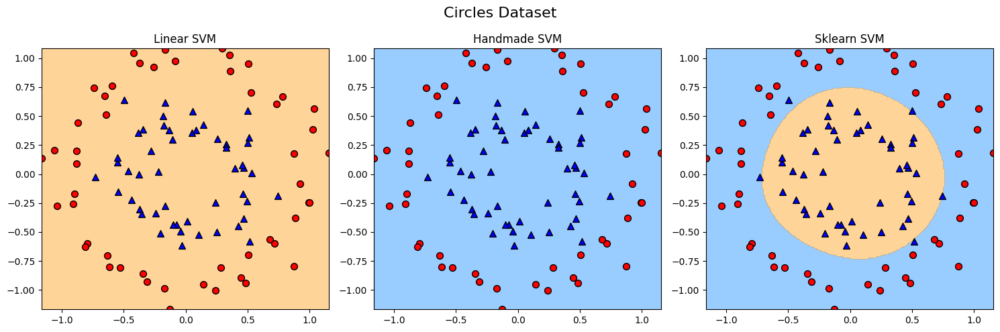

Linear SVM Accuracy on Moons: 1.00
Input shape: (20, 2)
Support vector shape: (36, 2)
Support vector shape: (36, 2)
Support vector shape: (36, 2)
Support vector shape: (36, 2)
Support vector shape: (36, 2)
Support vector shape: (36, 2)
Support vector shape: (36, 2)
Support vector shape: (36, 2)
Support vector shape: (36, 2)
Support vector shape: (36, 2)
Support vector shape: (36, 2)
Support vector shape: (36, 2)
Support vector shape: (36, 2)
Support vector shape: (36, 2)
Support vector shape: (36, 2)
Support vector shape: (36, 2)
Support vector shape: (36, 2)
Support vector shape: (36, 2)
Support vector shape: (36, 2)
Support vector shape: (36, 2)
Decision values: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
Handmade SVM Accuracy on Moons: 0.70
Input shape: (241536, 2)
Support vector shape: (36, 2)
Support vector shape: (36, 2)
Support vector shape: (36, 2)
Support vector shape: (36, 2)
Support vector shape: (36, 2)
Support vector shape: (36, 2)
Support vector shape: (

In [55]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.datasets import make_classification, make_circles, make_moons
from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import Perceptron
from sklearn.svm import SVC
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

# Plot decision boundary for each classifier
def plot_decision_boundary(clf, X, y, ax):
    # Create a mesh grid
    x_min, x_max = X[:, 0].min() - 1, X[:, 0].max() + 1
    y_min, y_max = X[:, 1].min() - 1, X[:, 1].max() + 1
    xx, yy = np.meshgrid(np.arange(x_min, x_max, 0.01),
                         np.arange(y_min, y_max, 0.01))
    
    # Predict class for each point in the grid
    Z = clf.predict(np.c_[xx.ravel(), yy.ravel()])
    Z = Z.reshape(xx.shape)
    
    # Plot decision boundary and data points
    ax.contourf(xx, yy, Z, levels=[-0.5, 0.5, 1.5], alpha=0.4, cmap='jet')  # Two levels for binary classification

    # Plot points for each class with different markers
    markers = ['o', '^', '*']  # Define different markers (e.g., 'o' for class 0, 's' for class 1)
    colors = ['red', 'blue', 'green']
    
    for idx, class_value in enumerate(np.unique(y)):
        ax.scatter(X[y == class_value, 0], X[y == class_value, 1],
                   c=colors[idx], marker=markers[idx], label=f'Class {class_value}',
                   edgecolor='k', s=50)

    ax.set_xlim(X[:, 0].min(), X[:, 0].max())
    ax.set_ylim(X[:, 1].min(), X[:, 1].max())

# Function to fit classifiers, show accuracy and plot decision boundaries
def fit_and_plot(X, y, dataset_name, classifiers):
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
    
    fig, axs = plt.subplots(1, 3, figsize=(15, 5))
    fig.suptitle(f'{dataset_name} Dataset', fontsize=16)
    
    for idx, (name, clf) in enumerate(classifiers.items()):
        # Fit the classifier
        clf.fit(X_train, y_train)
        
        # Make predictions
        y_pred = clf.predict(X_test)
        
        # Calculate accuracy
        accuracy = accuracy_score(y_test, y_pred)
        print(f'{name} Accuracy on {dataset_name}: {accuracy:.2f}')
        
        # Plot decision boundary
        axs[idx].set_title(name)
        plot_decision_boundary(clf, X, y, axs[idx])
    
    plt.tight_layout()
    plt.show()

# Create classifiers
classifiers = {
    'Linear SVM': SVC(kernel='linear'),
    'Handmade SVM': KernelSvmClassifier(C=1.0, kernel=GRBF),
    'Sklearn SVM': SVC(kernel='rbf')
}

# Generate synthetic data
X, y = make_circles(n_samples=100, noise=0.1, factor=0.5, random_state=42)

fit_and_plot(X, y, "Circles", classifiers)

# Generate synthetic data
X, y = make_moons(n_samples=100, noise=0.2, random_state=42)

fit_and_plot(X, y, "Moons", classifiers)